In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_12723.jpg
/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_13601.jpg
/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_1068.jpg
/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_16385.jpg
/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_3016.jpg
/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_15715.jpg
/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_19044.jpg
/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_18989.jpg
/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_8983.jpg
/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_11540.jpg
/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_4215.jpg
/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_15619.jpg
/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_

In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import glob
import tensorflow as tf
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.preprocessing import image
import seaborn as sns
from sklearn import metrics

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
main_path = '/kaggle/input/deepfake-and-real-images/Dataset'

train_dir = os.path.join(main_path, 'Train')
valid_dir = os.path.join(main_path, 'Validation')
test_dir = os.path.join(main_path, 'Test')

In [4]:
print("Train_dir Subfolders: ", os.listdir(train_dir))
print("Valid_dir Subfolders: ", os.listdir(valid_dir))
print("Test_dir Subfolders: ", os.listdir(test_dir))

Train_dir Subfolders:  ['Fake', 'Real']
Valid_dir Subfolders:  ['Fake', 'Real']
Test_dir Subfolders:  ['Fake', 'Real']


In [5]:
images_df = {
    "folder":[],
    "image_path":[],
    "label":[]
}

for folder in os.listdir(main_path): #iterate on each train, valid and test folder
    for label in os.listdir(main_path + "/" + folder): #iterate on fake and real folders (labels)
        for img in glob.glob(main_path + "/" + folder + "/" + label + "/*.jpg"):
            images_df["folder"].append(folder)
            images_df["image_path"].append(img)
            images_df["label"].append(label)

In [6]:
images_df = pd.DataFrame(images_df)

In [8]:
images_df

,folder,image_path,label
0,Validation,/kaggle/input/deepfake-and-real-images/Dataset...,Fake
1,Validation,/kaggle/input/deepfake-and-real-images/Dataset...,Fake
2,Validation,/kaggle/input/deepfake-and-real-images/Dataset...,Fake
3,Validation,/kaggle/input/deepfake-and-real-images/Dataset...,Fake
4,Validation,/kaggle/input/deepfake-and-real-images/Dataset...,Fake
...,...,...,...
190330,Train,/kaggle/input/deepfake-and-real-images/Dataset...,Real
190331,Train,/kaggle/input/deepfake-and-real-images/Dataset...,Real
190332,Train,/kaggle/input/deepfake-and-real-images/Dataset...,Real
190333,Train,/kaggle/input/deepfake-and-real-images/Dataset...,Real


In [15]:
real_grouped_df = images_df[images_df['label'] == "Real"].groupby('folder')
fake_grouped_df = images_df[images_df['label'] == "Fake"].groupby('folder')

In [16]:
real_grouped_df.size()

folder
Test           5413
Train         70001
Validation    19787
dtype: int64

In [17]:
fake_grouped_df.size()


folder
Test           5492
Train         70001
Validation    19641
dtype: int64

In [18]:
image_train_gen = tf.keras.preprocessing.image.ImageDataGenerator(
                                  rescale=1./255.,
                                  horizontal_flip=True,
                                  )

image_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

In [19]:
train_ds = image_train_gen.flow_from_directory(
    train_dir,
    target_size=(256, 256),
    batch_size=64,
    class_mode='binary',
)

valid_ds = image_gen.flow_from_directory(
    valid_dir,
    target_size=(256, 256),
    batch_size=64,
    class_mode='binary'
)

test_ds = image_gen.flow_from_directory(
    test_dir,
    target_size=(256, 256),
    batch_size=64,
    class_mode='binary',
    shuffle=False) #shuffle disabled

Found 140002 images belonging to 2 classes.
Found 39428 images belonging to 2 classes.
Found 10905 images belonging to 2 classes.


In [20]:
def plot_images(img, label):
    plt.figure(figsize=[12, 12])
    for i in range(16):
        plt.subplot(4, 4, i+1)
        plt.imshow(img[i])
        plt.axis('off')
        if label[i] == 0:
            plt.title("Fake")
        else:
            plt.title("Real")

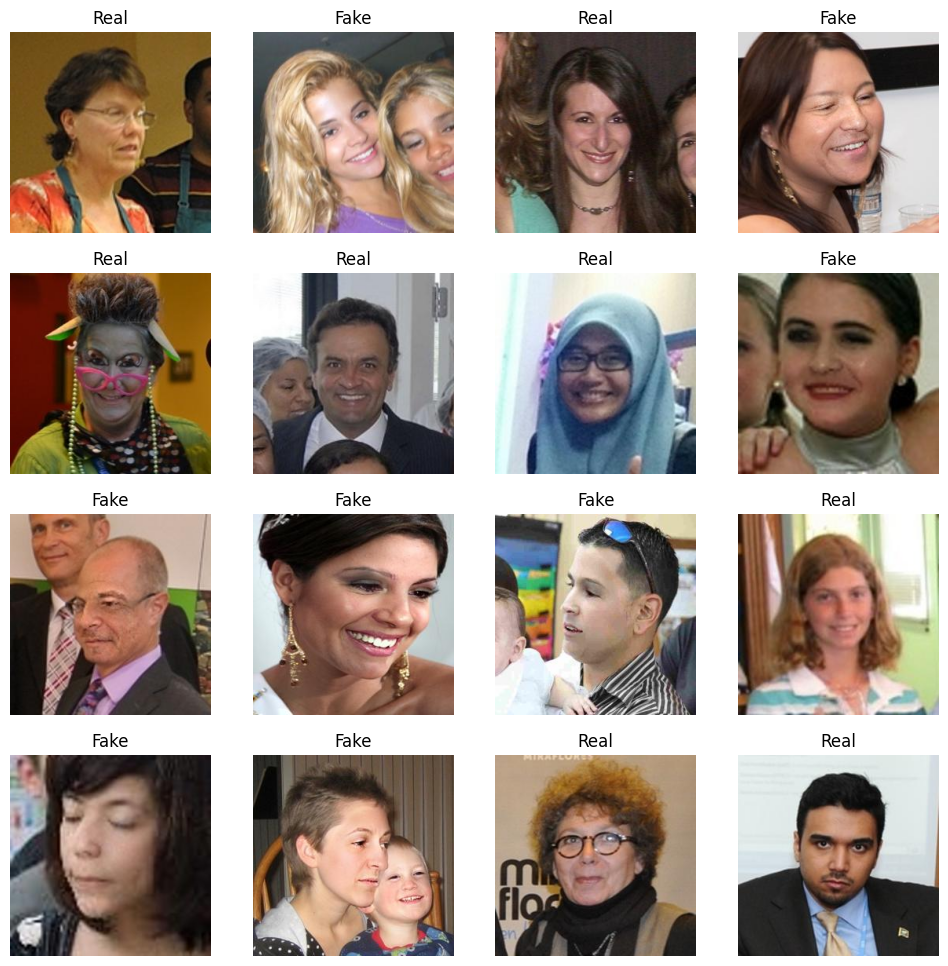

In [21]:
img,lbl = next(train_ds)
plot_images(img,lbl)

In [22]:
for img, label in train_ds:
    print("Values: ", img[0])
    print("Label: ", label[0])
    break

Values:  [[[0.48627454 0.227451   0.23529413]
  [0.47450984 0.21568629 0.22352943]
  [0.47058827 0.20000002 0.21176472]
  ...
  [0.69411767 0.2509804  0.25882354]
  [0.6784314  0.23529413 0.24313727]
  [0.6627451  0.21960786 0.227451  ]]

 [[0.47058827 0.21176472 0.21960786]
  [0.45882356 0.20000002 0.20784315]
  [0.45882356 0.18823531 0.20000002]
  ...
  [0.68235296 0.2392157  0.24705884]
  [0.67058825 0.227451   0.23529413]
  [0.65882355 0.21568629 0.22352943]]

 [[0.4666667  0.20784315 0.21568629]
  [0.45882356 0.20000002 0.20784315]
  [0.45882356 0.18823531 0.20000002]
  ...
  [0.6784314  0.23529413 0.24313727]
  [0.67058825 0.227451   0.23529413]
  [0.6666667  0.22352943 0.23137257]]

 ...

 [[0.49411768 0.32156864 0.31764707]
  [0.49803925 0.3254902  0.32156864]
  [0.4901961  0.3254902  0.33333334]
  ...
  [0.7803922  0.41960788 0.32941177]
  [0.77647066 0.4156863  0.3254902 ]
  [0.7686275  0.40784317 0.31764707]]

 [[0.5019608  0.32941177 0.3254902 ]
  [0.5058824  0.33333334 0.3

In [23]:
for img, label in train_ds:
    print(img.shape)
    print(label.shape)
    break

(64, 256, 256, 3)
(64,)


In [24]:
train_ds.class_indices

{'Fake': 0, 'Real': 1}

In [25]:
input_shape = (256, 256, 3) #define the input shape of our data

CNN

In [26]:
import tensorflow as tf
from tensorflow.keras import layers

def get_custom_cnn_model(input_shape):
    model = tf.keras.Sequential()

    # Convolutional layers
    model.add(layers.Conv2D(64, (3, 3), activation='relu', input_shape=input_shape))
    model.add(layers.MaxPooling2D((2, 2)))
    
    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    
    model.add(layers.Conv2D(256, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))

    # Flatten layer
    model.add(layers.Flatten())

    # Fully connected layers
    model.add(layers.Dense(512, activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(0.3))

    # Output layer for binary classification
    model.add(layers.Dense(1, activation='sigmoid'))

    model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
    
    return model

# Define the input shape, e.g., (128, 128, 3) for 128x128 color images

custom_cnn_model = get_custom_cnn_model(input_shape)

In [27]:
custom_cnn_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2  (None, 127, 127, 64)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 128)     73856     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 62, 62, 128)       0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 256)       295168    
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 30, 30, 256)       0

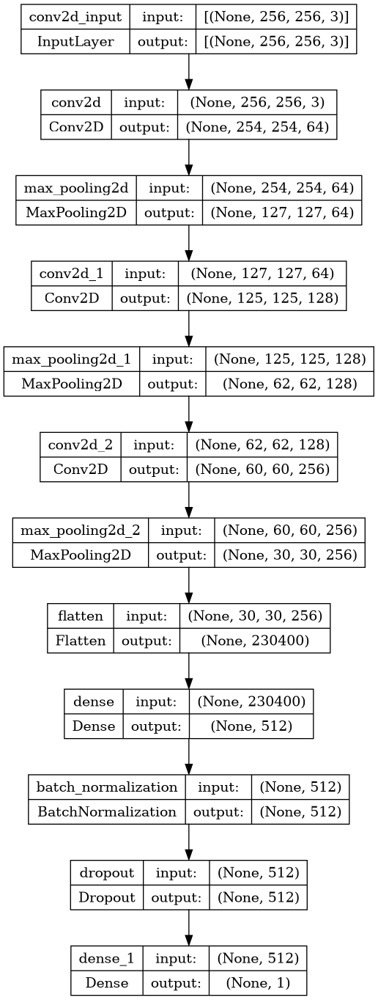

In [28]:
tf.keras.utils.plot_model(custom_cnn_model, show_shapes=True)

In [31]:
checkpoint_filepath = "model_cp.h5"

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min', #minimize the loss value
    save_best_only=True)

In [32]:
early_stopping_cb = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                     patience=5,
                                                     restore_best_weights=True,
                                                    )

In [33]:
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                                 factor=0.2,
                                                 patience=3)

In [34]:
history_ft_cnn = custom_cnn_model.fit(train_ds,
                       epochs = 5,
                       validation_data = valid_ds,
                       callbacks=[checkpoint_cb, early_stopping_cb, reduce_lr])

Epoch 1/5
2188/2188 [==============================] - 1850s 840ms/step - loss: 0.3682 - accuracy: 0.8327 - val_loss: 2.1853 - val_accuracy: 0.8242 - lr: 0.0010
Epoch 2/5
2188/2188 [==============================] - 719s 328ms/step - loss: 0.2258 - accuracy: 0.9071 - val_loss: 3.5854 - val_accuracy: 0.8916 - lr: 0.0010
Epoch 3/5
2188/2188 [==============================] - 683s 312ms/step - loss: 0.1813 - accuracy: 0.9265 - val_loss: 1.0529 - val_accuracy: 0.9057 - lr: 0.0010
Epoch 4/5
2188/2188 [==============================] - 634s 290ms/step - loss: 0.2439 - accuracy: 0.8968 - val_loss: 11.7086 - val_accuracy: 0.6761 - lr: 0.0010
Epoch 5/5
2188/2188 [==============================] - 545s 249ms/step - loss: 0.1898 - accuracy: 0.9227 - val_loss: 1.2316 - val_accuracy: 0.8614 - lr: 0.0010


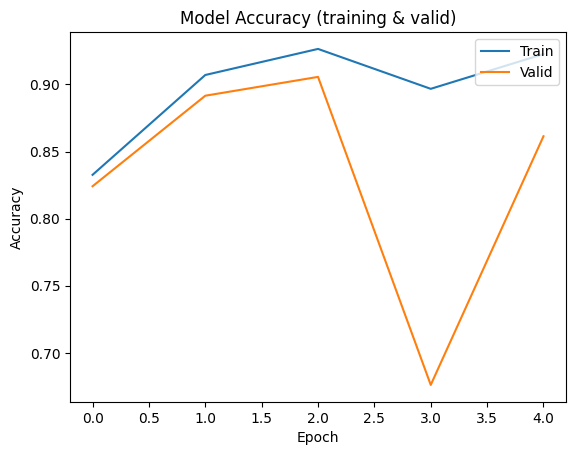

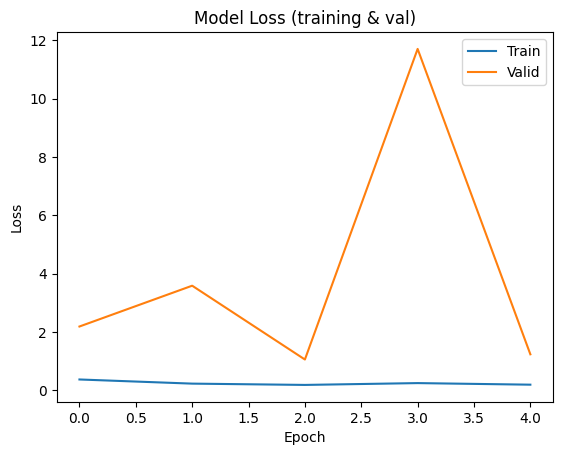

In [36]:
plt.plot(history_ft_cnn.history['accuracy'])
plt.plot(history_ft_cnn.history['val_accuracy'])
plt.title('Model Accuracy (training & valid)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Valid'], loc='upper right')
plt.show()


plt.plot(history_ft_cnn.history['loss'])
plt.plot(history_ft_cnn.history['val_loss'])
plt.title('Model Loss (training & val)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Valid'], loc='upper right')
plt.show()

In [37]:
# Evaluate the model on the test set
test_loss, test_acc = custom_cnn_model.evaluate(test_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_acc)

171/171 [==============================] - 108s 632ms/step - loss: 0.4898 - accuracy: 0.8139
Test Loss: 0.48979464173316956
Test Accuracy: 0.813938558101654


1/1 [==============================] - 0s 19ms/step


Text(0.5, 1.0, 'This image is 100.00% Fake and 0.00% Real.')

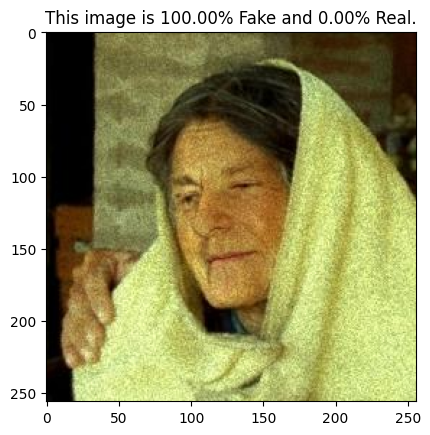

In [46]:
#real example
test_image = tf.keras.preprocessing.image.load_img('/kaggle/input/deepfake-and-real-images/Dataset/Test/Fake/fake_0.jpg', target_size=(256, 256, 3))
plt.imshow(test_image)


test_image_arr = tf.keras.preprocessing.image.img_to_array(test_image)
test_image_arr = np.expand_dims(test_image, axis=0)
test_image_arr = test_image_arr/255.


result = custom_cnn_model.predict(test_image_arr)

plt.title(f"This image is {100 * (1 - result[0][0]):.2f}% Fake and {100 * result[0][0]:.2f}% Real.")


In [47]:
predicted_labels = custom_cnn_model.predict(test_ds)
true_labels = test_ds.classes


171/171 [==============================] - 28s 161ms/step


In [48]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

accuracy = accuracy_score(true_labels, predicted_labels.round())
precision = precision_score(true_labels, predicted_labels.round())
recall = recall_score(true_labels, predicted_labels.round())
f1 = f1_score(true_labels, predicted_labels.round())

# Print the results
print("Confusion Matrix:")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

Confusion Matrix:
Accuracy: 0.8139385602934434
Precision: 0.7497048406139315
Recall: 0.9384814335858119
F1 Score: 0.8335384362950201


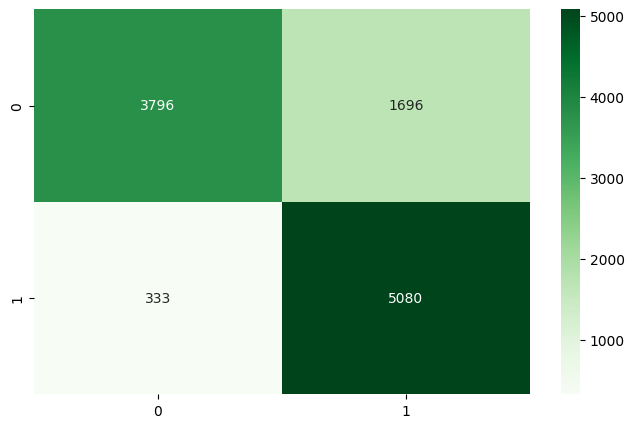

In [49]:
plt.figure(figsize = (8,5))
sns.heatmap(metrics.confusion_matrix(true_labels, predicted_labels.round()), annot = True,fmt="d",cmap = "Greens")
plt.show()

DENSENET

In [50]:
#create the model's architecture and compile it
def get_densenet_model(input_shape):

    input = tf.keras.Input(shape=input_shape)

    densenet = tf.keras.applications.DenseNet121( weights="imagenet", include_top=False, input_tensor = input)

    x = tf.keras.layers.GlobalAveragePooling2D()(densenet.output)
    x = tf.keras.layers.Dense(512, activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dropout(0.3)(x)
    output = tf.keras.layers.Dense(1, activation='sigmoid')(x) #binary classification

    model = tf.keras.Model(densenet.input, output)

    model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

    return model


In [51]:
densenet_model = get_densenet_model(input_shape)

29084464/29084464 [==============================] - 2s 0us/step


In [52]:
checkpoint_filepath = "model_cp_dense.h5"

checkpoint_cb_dense = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min', #minimize the loss value
    save_best_only=True)

In [53]:
history_ft_densenet = densenet_model.fit(train_ds,
                       epochs = 5,
                       validation_data = valid_ds,
                       callbacks=[checkpoint_cb_dense, early_stopping_cb, reduce_lr])

Epoch 1/5
2188/2188 [==============================] - 1142s 490ms/step - loss: 0.0948 - accuracy: 0.9625 - val_loss: 0.1175 - val_accuracy: 0.9567 - lr: 0.0010
Epoch 2/5
2188/2188 [==============================] - 1047s 478ms/step - loss: 0.0612 - accuracy: 0.9754 - val_loss: 0.1176 - val_accuracy: 0.9541 - lr: 0.0010
Epoch 3/5
2188/2188 [==============================] - 1048s 479ms/step - loss: 0.0537 - accuracy: 0.9787 - val_loss: 0.0738 - val_accuracy: 0.9716 - lr: 0.0010
Epoch 4/5
2188/2188 [==============================] - 1052s 481ms/step - loss: 0.0486 - accuracy: 0.9807 - val_loss: 0.0790 - val_accuracy: 0.9703 - lr: 0.0010
Epoch 5/5
2188/2188 [==============================] - 1049s 479ms/step - loss: 0.0432 - accuracy: 0.9827 - val_loss: 0.0760 - val_accuracy: 0.9688 - lr: 0.0010


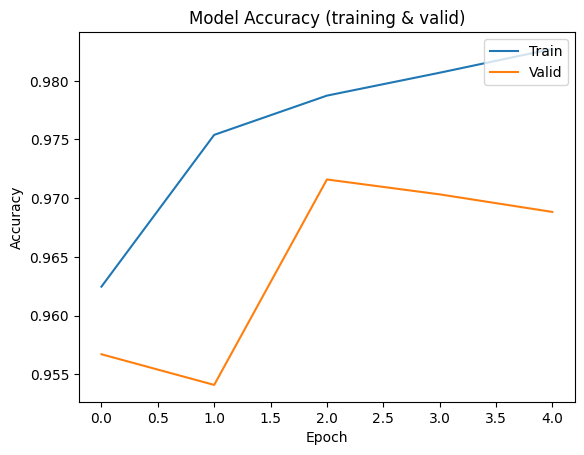

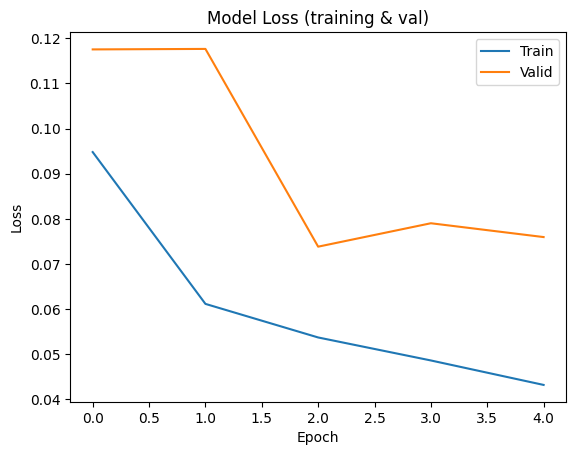

In [54]:
plt.plot(history_ft_densenet.history['accuracy'])
plt.plot(history_ft_densenet.history['val_accuracy'])
plt.title('Model Accuracy (training & valid)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Valid'], loc='upper right')
plt.show()


plt.plot(history_ft_densenet.history['loss'])
plt.plot(history_ft_densenet.history['val_loss'])
plt.title('Model Loss (training & val)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Valid'], loc='upper right')
plt.show()

In [55]:
# Evaluate the model on the test set
test_loss, test_acc = densenet_model.evaluate(test_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_acc)

171/171 [==============================] - 44s 260ms/step - loss: 0.2094 - accuracy: 0.9149
Test Loss: 0.20937153697013855
Test Accuracy: 0.9149014353752136


1/1 [==============================] - 3s 3s/step


Text(0.5, 1.0, 'This image is 99.98% Fake and 0.02% Real.')

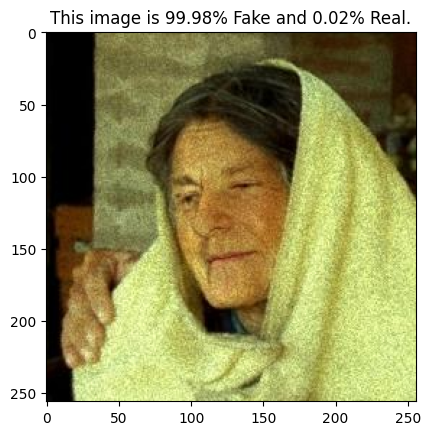

In [56]:
#real example
test_image = tf.keras.preprocessing.image.load_img('/kaggle/input/deepfake-and-real-images/Dataset/Test/Fake/fake_0.jpg', target_size=(256, 256, 3))
plt.imshow(test_image)


test_image_arr = tf.keras.preprocessing.image.img_to_array(test_image)
test_image_arr = np.expand_dims(test_image, axis=0)
test_image_arr = test_image_arr/255.


result = densenet_model.predict(test_image_arr)

plt.title(f"This image is {100 * (1 - result[0][0]):.2f}% Fake and {100 * result[0][0]:.2f}% Real.")


In [57]:
predicted_labels1 = densenet_model.predict(test_ds)
true_labels = test_ds.classes


171/171 [==============================] - 33s 183ms/step


In [59]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

accuracy1 = accuracy_score(true_labels, predicted_labels1.round())
precision1 = precision_score(true_labels, predicted_labels1.round())
recall1 = recall_score(true_labels, predicted_labels1.round())
f11 = f1_score(true_labels, predicted_labels1.round())

# Print the results
print("Confusion Matrix:")
print("Accuracy:", accuracy1)
print("Precision:", precision1)
print("Recall:", recall1)
print("F1 Score:", f11)

Confusion Matrix:
Accuracy: 0.9149014213663457
Precision: 0.948948948948949
Recall: 0.8756696840938482
F1 Score: 0.9108378170637971


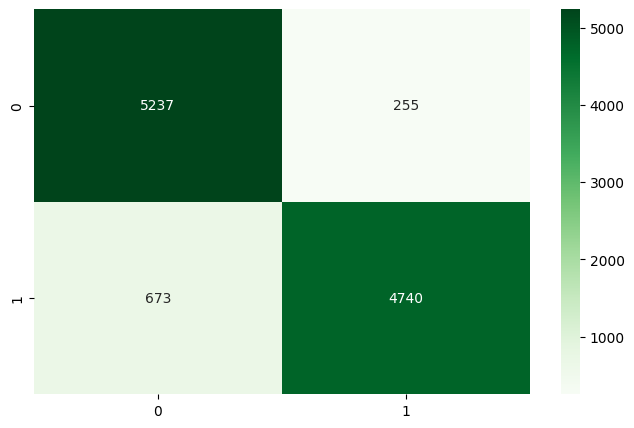

In [60]:
plt.figure(figsize = (8,5))
sns.heatmap(metrics.confusion_matrix(true_labels, predicted_labels1.round()), annot = True,fmt="d",cmap = "Greens")
plt.show()

XCEPTION

In [61]:
#create the model's architecture and compile it
def get_xcp_model(input_shape):

    input = tf.keras.Input(shape=input_shape)

    xception = tf.keras.applications.Xception( weights="imagenet", include_top=False, input_tensor = input)

    x = tf.keras.layers.GlobalAveragePooling2D()(xception.output)
    x = tf.keras.layers.Dense(512, activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dropout(0.3)(x)
    output = tf.keras.layers.Dense(1, activation='sigmoid')(x) #binary classification

    model = tf.keras.Model(xception.input, output)

    model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])

    return model

xcp_model = get_xcp_model(input_shape)

83683744/83683744 [==============================] - 4s 0us/step


In [62]:
checkpoint_filepath = "model_cp_xce.h5"

checkpoint_cb_xce = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min', #minimize the loss value
    save_best_only=True)

In [63]:
history_ft_xception = xcp_model.fit(train_ds,
                       epochs = 5,
                       validation_data = valid_ds,
                       callbacks=[checkpoint_cb_xce, early_stopping_cb, reduce_lr])

Epoch 1/5
2188/2188 [==============================] - 1587s 710ms/step - loss: 0.0718 - accuracy: 0.9727 - val_loss: 0.1029 - val_accuracy: 0.9581 - lr: 0.0010
Epoch 2/5
2188/2188 [==============================] - 1554s 710ms/step - loss: 0.0431 - accuracy: 0.9833 - val_loss: 0.1840 - val_accuracy: 0.9468 - lr: 0.0010
Epoch 3/5
2188/2188 [==============================] - 1549s 708ms/step - loss: 0.0386 - accuracy: 0.9848 - val_loss: 0.0798 - val_accuracy: 0.9728 - lr: 0.0010
Epoch 4/5
2188/2188 [==============================] - 1564s 715ms/step - loss: 0.0340 - accuracy: 0.9865 - val_loss: 0.0960 - val_accuracy: 0.9611 - lr: 0.0010
Epoch 5/5
2188/2188 [==============================] - 1566s 716ms/step - loss: 0.0297 - accuracy: 0.9881 - val_loss: 0.0528 - val_accuracy: 0.9821 - lr: 0.0010


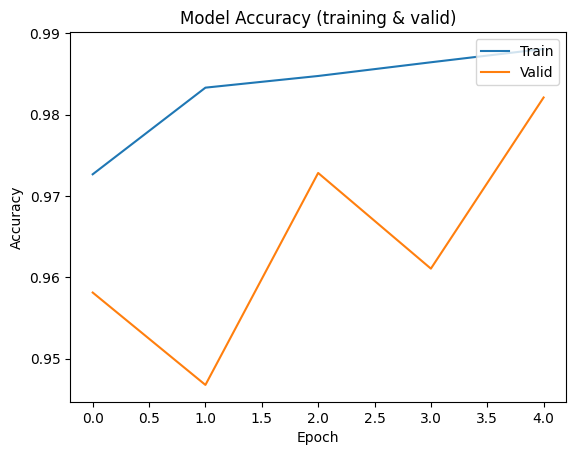

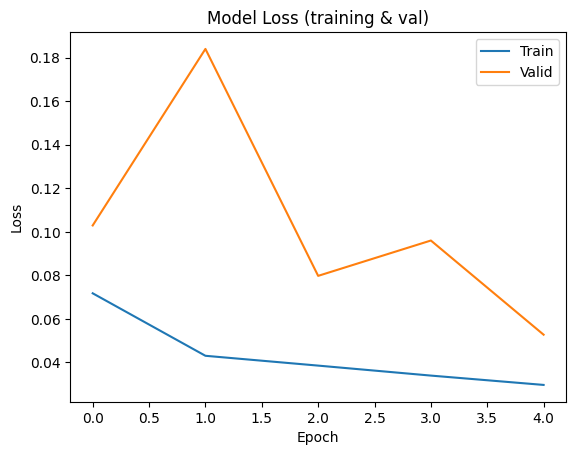

In [64]:
plt.plot(history_ft_xception.history['accuracy'])
plt.plot(history_ft_xception.history['val_accuracy'])
plt.title('Model Accuracy (training & valid)')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Valid'], loc='upper right')
plt.show()


plt.plot(history_ft_xception.history['loss'])
plt.plot(history_ft_xception.history['val_loss'])
plt.title('Model Loss (training & val)')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Valid'], loc='upper right')
plt.show()

In [65]:
# Evaluate the model on the test set
test_loss, test_acc = xcp_model.evaluate(test_ds)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_acc)

171/171 [==============================] - 44s 254ms/step - loss: 0.7518 - accuracy: 0.8804
Test Loss: 0.7517927289009094
Test Accuracy: 0.8804218173027039


1/1 [==============================] - 1s 1s/step


Text(0.5, 1.0, 'This image is 100.00% Fake and 0.00% Real.')

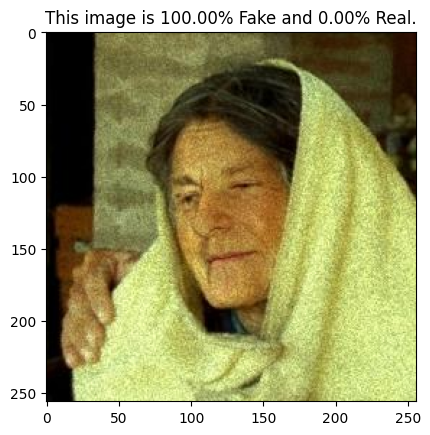

In [66]:
#real example
test_image = tf.keras.preprocessing.image.load_img('/kaggle/input/deepfake-and-real-images/Dataset/Test/Fake/fake_0.jpg', target_size=(256, 256, 3))
plt.imshow(test_image)


test_image_arr = tf.keras.preprocessing.image.img_to_array(test_image)
test_image_arr = np.expand_dims(test_image, axis=0)
test_image_arr = test_image_arr/255.


result = xcp_model.predict(test_image_arr)

plt.title(f"This image is {100 * (1 - result[0][0]):.2f}% Fake and {100 * result[0][0]:.2f}% Real.")


In [67]:
predicted_labels2 = xcp_model.predict(test_ds)
true_labels = test_ds.classes

171/171 [==============================] - 33s 187ms/step


In [68]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

accuracy2 = accuracy_score(true_labels, predicted_labels2.round())
precision2 = precision_score(true_labels, predicted_labels2.round())
recall2 = recall_score(true_labels, predicted_labels2.round())
f12 = f1_score(true_labels, predicted_labels2.round())

# Print the results
print("Confusion Matrix:")
print("Accuracy:", accuracy2)
print("Precision:", precision2)
print("Recall:", recall2)
print("F1 Score:", f12)

Confusion Matrix:
Accuracy: 0.8804218248509857
Precision: 0.9568601289748722
Recall: 0.7949381119527065
F1 Score: 0.8684157416750756


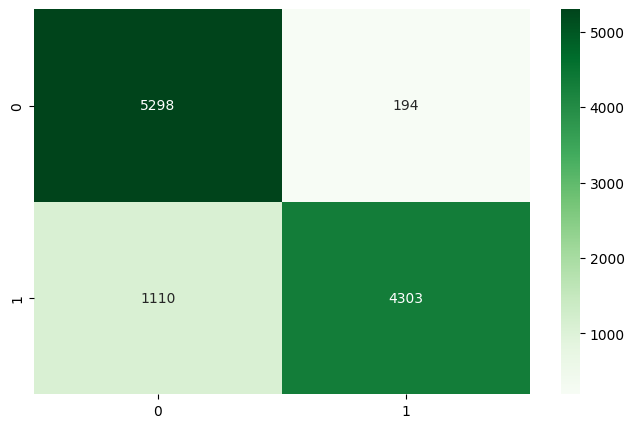

In [69]:
plt.figure(figsize = (8,5))
sns.heatmap(metrics.confusion_matrix(true_labels, predicted_labels2.round()), annot = True,fmt="d",cmap = "Greens")
plt.show()